### Duck-farm-604 Data Analysis

##### Load Module

In [31]:
import numpy as np
import pandas as pd
import os, json, cv2, random
from os.path import join
from glob import glob
from tqdm import tqdm
from PIL import Image
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from skimage.feature import peak_local_max


##### Some Functions

In [32]:
# imshow function (cv2 image -> plt image -> plt.show)
# cv2 image를 plt image로 출력 
def imshow(in_img):
    out_img = cv2.cvtColor(in_img,cv2.COLOR_BGR2RGB) 
    plt.figure(figsize=(7,7))
    plt.imshow(out_img)
    plt.axis('off')
    plt.show()

# Return Name (dataset/image/20_1_0.png -> 20_1_0.png)
def name(item):
    return os.path.basename(item)
    
# Return Directory (20_1_0.png -> dataset/image/20_1_0.png)
def dir(item):
    return 'dataset/image/'+item

##### Make image_list, CSV to Dictionary

In [33]:
# 이미지 파일명을 리스트로 저장
image_list = glob("dataset/image/*.png")

# csv 파일 읽어서 list로 저장 (image,xmin,ymin,xmax,ymax)
csv_list=pd.read_csv('dataset/Duck-farm-604-export.csv',usecols=['image','xmin','ymin','xmax','ymax','label']).values.tolist()

# csv_list의 0번째 원소를 기준으로 딕셔너리화 (+이상치 정제)
d=dict()
for c in csv_list:
    # xmin!=xmax -> width존재, ymin!=ymax -> height존재일 때 처리함 
    if c[1]!=c[3] and c[2]!=c[4]:
        if c[0] in d:
            d[c[0]].append(c[1:6])
        else:
            d[c[0]]=[c[1:6]]

# 임의 출력
print(d['32_2_270.png'],len(d['32_2_270.png']))
print(len(d))

[[1696.777041942605, 419.6088657105607, 1915.7615894039736, 906.4348821989532, 'duck'], [1038.41059602649, 377.7437827225131, 1224.9006622516556, 864.0265052356021, 'duck'], [1277.1743929359827, 424.39299738219904, 1514.5253863134662, 767.4054758800522, 'duck'], [720.7038123167156, 403.177750653597, 921.9941348973608, 832.9159705488848, 'duck'], [445.0331125827815, 407.4296465968587, 641.4128035320089, 811.7228403141362, 'duck'], [192.1412803532009, 415.9113219895288, 409.7130242825608, 838.5814790575917, 'duck'], [1521.58940397351, 418.7385471204189, 1743.3995584988966, 806.0683900523561, 'duck']] 7
603


##### Select test_image

dataset/image/32_2_270.png


(-0.5, 1919.5, 1079.5, -0.5)

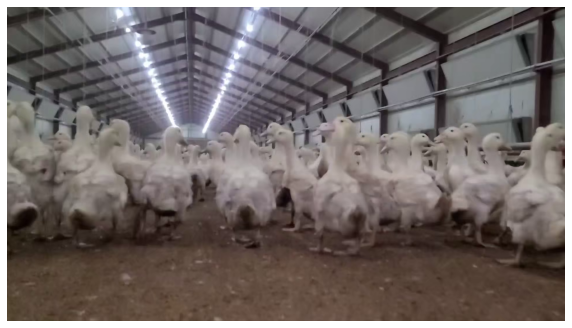

In [34]:
test_image = dir('32_2_270.png') # image_list[0] on my computer 
print(test_image)

# load image
image = plt.imread(test_image)
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('off')

##### Check Bounding Box

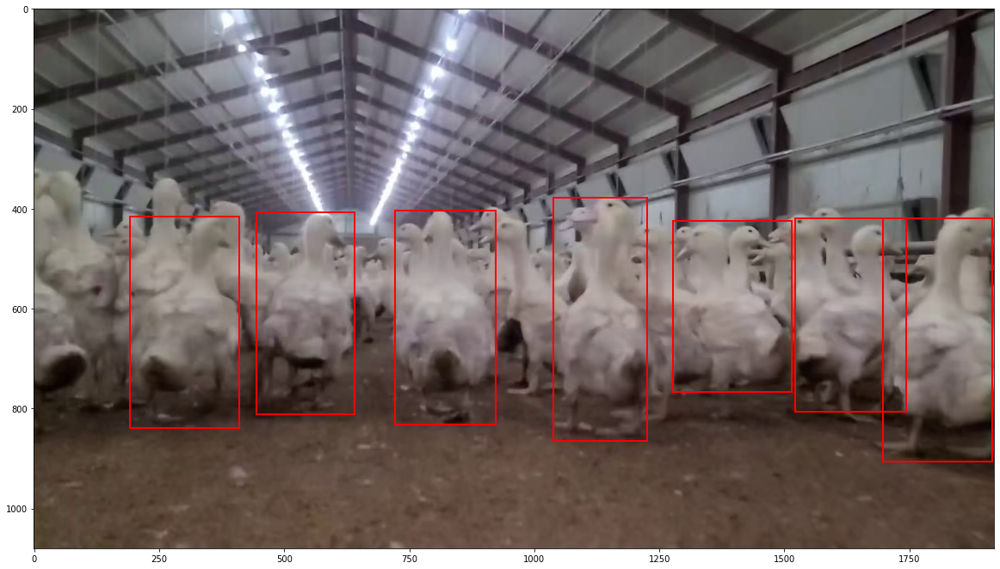

In [35]:
# load image
image = plt.imread(test_image)
plt.figure(figsize=(20,20))

# bounding box check
for item in d[name(test_image)]:
    xmin = float(item[0])
    ymin = float(item[1])
    xmax = float(item[2])
    ymax = float(item[3])
    width = xmax - xmin
    height = ymax - ymin
    ax = plt.gca()
    plt.imshow(image)
    rect = patches.Rectangle(
            (xmin, ymin), width, height, linewidth=2, edgecolor='red', fill=False
        )
    ax.add_patch(rect)

##### Make 'img' Object and Check Image Shape

In [36]:
img = cv2.imread(test_image)

print('img.ndim=',img.ndim) # 차원
print('img.shape=',img.shape) # 배열 형태
print('img.dtype=',img.dtype) # 타입

img.ndim= 3
img.shape= (1080, 1920, 3)
img.dtype= uint8


##### Make Duck Images

0: xmin=192, xmax=409, ymin=415, ymax=838
1: xmin=445, xmax=641, ymin=407, ymax=811
2: xmin=720, xmax=921, ymin=403, ymax=832
3: xmin=1038, xmax=1224, ymin=377, ymax=864
4: xmin=1277, xmax=1514, ymin=424, ymax=767
5: xmin=1521, xmax=1743, ymin=418, ymax=806
6: xmin=1696, xmax=1915, ymin=419, ymax=906


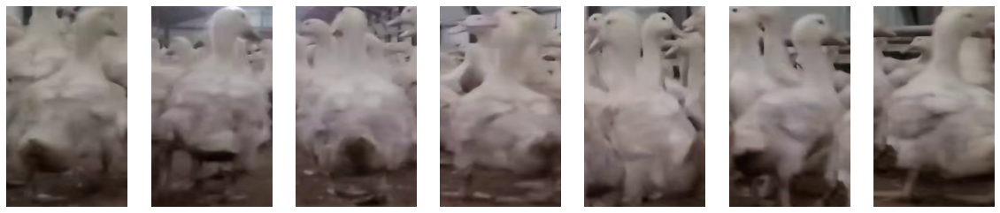

In [37]:
# make test_image_annotation (sorted by xmin)
test_annotation=d[name(test_image)]
ta_df=pd.DataFrame(test_annotation)
ta_df.columns=['xmin','xmax','ymin','ymax','status'] 
ta_df=ta_df.sort_values(by=['xmin'],axis=0)
test_annotation=ta_df.to_numpy()

# make duck images
ducks=[]
ducks_info=[]
for i,item in enumerate(test_annotation):
    # find duck of test_image
    xmin = int(item[0])
    ymin = int(item[1])
    xmax = int(item[2])
    ymax = int(item[3])
    print('{}: xmin={}, xmax={}, ymin={}, ymax={}'.format(i,xmin,xmax,ymin,ymax))
    ducks_info.append('xmin={}, xmax={}, ymin={}, ymax={}'.format(xmin,xmax,ymin,ymax))

    # store
    duck=img[ymin:ymax,xmin:xmax]
    duck=cv2.resize(duck,(300,500))
    ducks.append(duck)

# show duck image
f, a = plt.subplots(1,7,figsize=(20,20))
a=a.ravel()
for i,ax in enumerate(a):
    duck=cv2.cvtColor(ducks[i],cv2.COLOR_BGR2RGB)
    ax.imshow(duck)
    ax.axis('off')
plt.show()

##### Check Historgram (Duck)

0: xmin=192, xmax=409, ymin=415, ymax=838


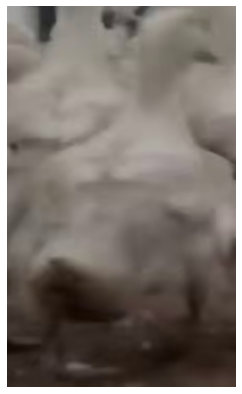

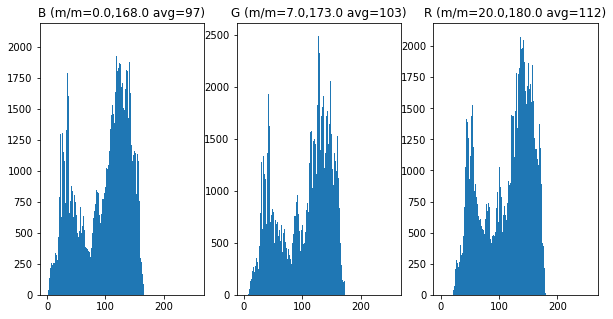

1: xmin=445, xmax=641, ymin=407, ymax=811


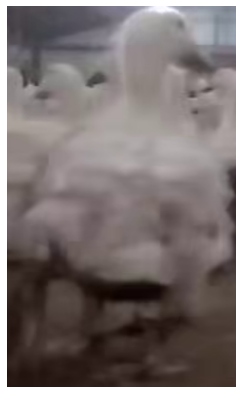

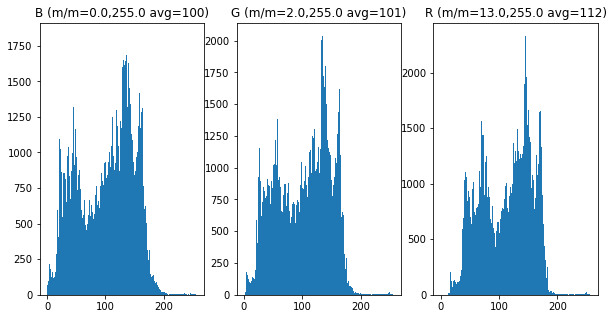

2: xmin=720, xmax=921, ymin=403, ymax=832


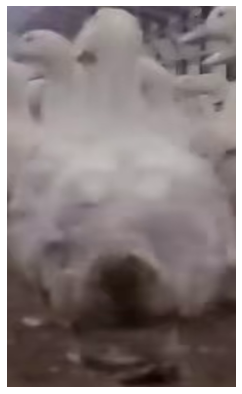

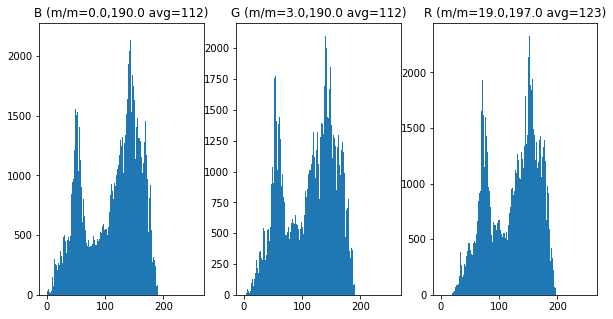

3: xmin=1038, xmax=1224, ymin=377, ymax=864


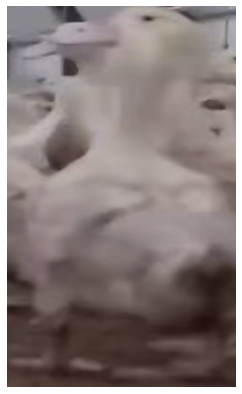

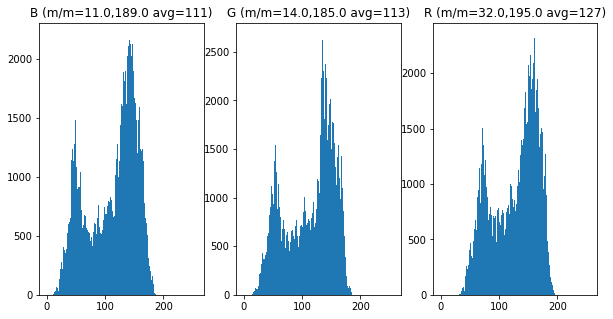

4: xmin=1277, xmax=1514, ymin=424, ymax=767


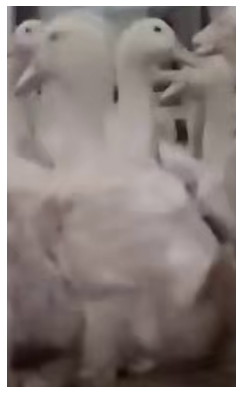

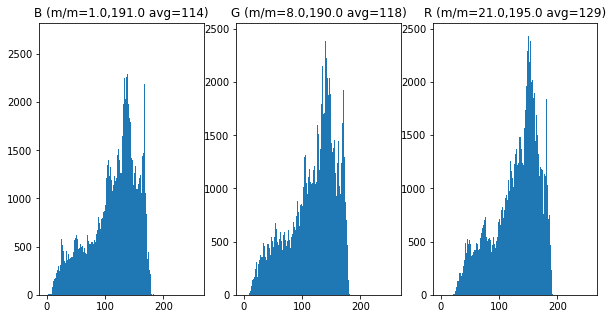

5: xmin=1521, xmax=1743, ymin=418, ymax=806


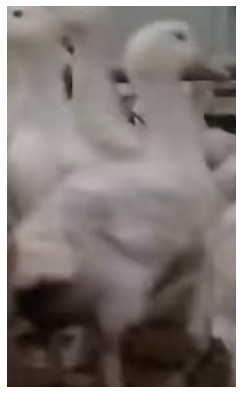

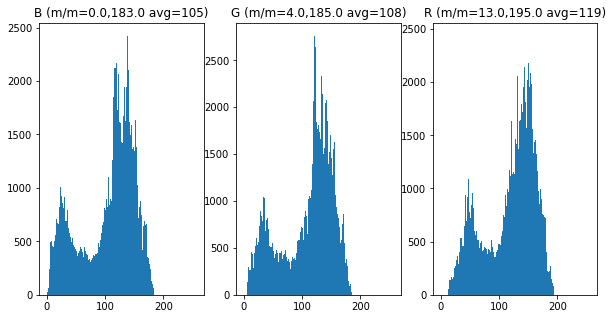

6: xmin=1696, xmax=1915, ymin=419, ymax=906


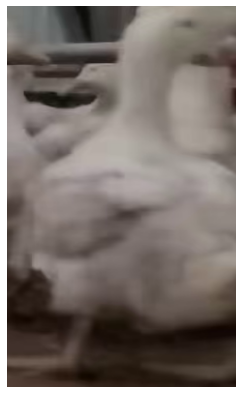

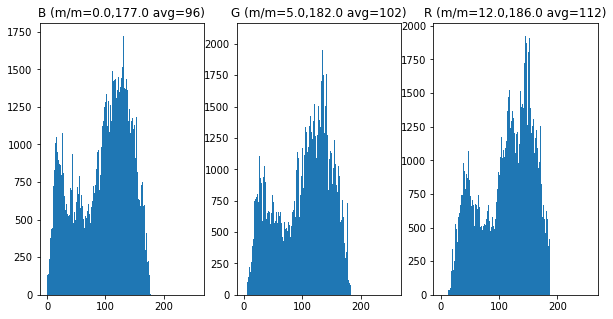

In [38]:
for i,duck in enumerate(ducks):
    print(str(i)+":",ducks_info[i])
    # show duck
    showImg=duck
    imshow(showImg)

    # show histogram of duck
    clr=['B','G','R']
    f, a = plt.subplots(1,3,figsize=(10,5))
    a=a.ravel()
    for i,ax in enumerate(a):
        simg=duck.T[i]
        ax.hist(simg.flatten(),range=[0,256],bins=256)
        min_val,max_val,min_loc,max_loc=cv2.minMaxLoc(simg)
        avg_val=round(simg.mean())
        ax.set_title(str(clr[i])+' (m/m={},{} avg={})'.format(min_val,max_val,avg_val))
    plt.show()

##### Make Background Images

0: xmin=0, xmax=300, ymin=0, ymax=300
1: xmin=300, xmax=600, ymin=0, ymax=300
2: xmin=600, xmax=900, ymin=0, ymax=300
3: xmin=900, xmax=1200, ymin=0, ymax=300
4: xmin=1200, xmax=1500, ymin=0, ymax=300
5: xmin=1500, xmax=1800, ymin=0, ymax=300
6: xmin=0, xmax=300, ymin=850, ymax=1070
7: xmin=300, xmax=600, ymin=850, ymax=1070
8: xmin=600, xmax=900, ymin=850, ymax=1070
9: xmin=900, xmax=1200, ymin=850, ymax=1070
10: xmin=1200, xmax=1500, ymin=850, ymax=1070
11: xmin=1500, xmax=1800, ymin=850, ymax=1070


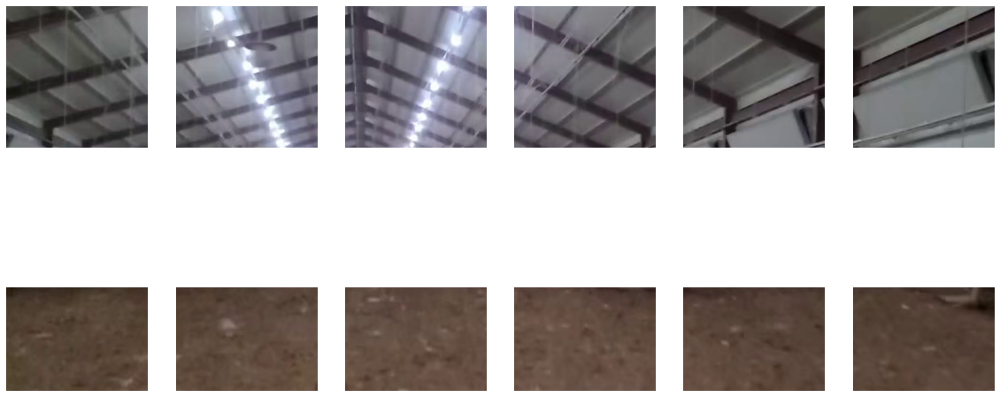

In [39]:
# make background images
bimgs=[]
bimgs_info=[]
for i in range(6):
    bimgs.append(img[0:300,300*i:300+(300*i)]) # 0:300, 0:300 -> 0:300, 300:600 -> 0:300, 600:900 -> ...
    bimgs_info.append('xmin={}, xmax={}, ymin={}, ymax={}'.format(300*i,300+(300*i),0,300))
    print(str(i)+': '+ bimgs_info[i])
for i in range(6,12):
    bimgs.append(img[850:1070,300*(i-6):300+(300*(i-6))]) # 850:1070, 0:300 -> 850:1070, 300:600 -> 850:1070, 600:900 -> ...
    bimgs_info.append('xmin={}, xmax={}, ymin={}, ymax={}'.format(300*(i-6),300+(300*(i-6)),850,1070))
    print(str(i)+': '+ bimgs_info[i])

# show background image
f, a = plt.subplots(2,6,figsize=(20,10))
a=a.ravel()
for i,ax in enumerate(a):
    bimg=cv2.cvtColor(bimgs[i],cv2.COLOR_BGR2RGB)
    ax.imshow(bimg)
    ax.axis('off')
plt.show()

##### Check Historgram (Background)

0: xmin=0, xmax=300, ymin=0, ymax=300  -> (resized: 500x300)


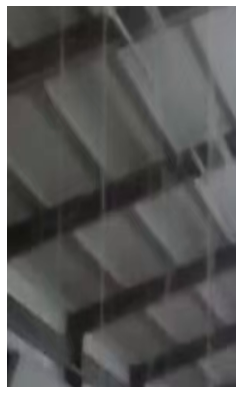

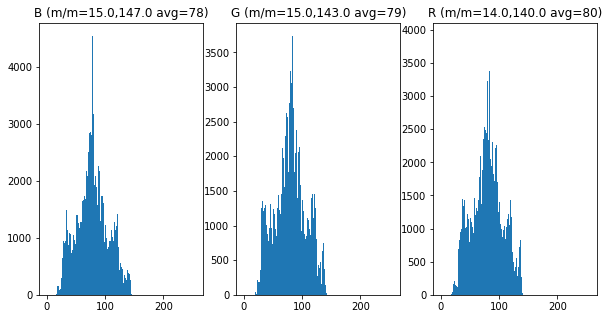

1: xmin=300, xmax=600, ymin=0, ymax=300  -> (resized: 500x300)


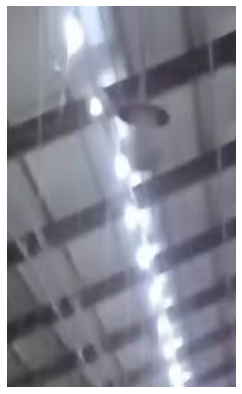

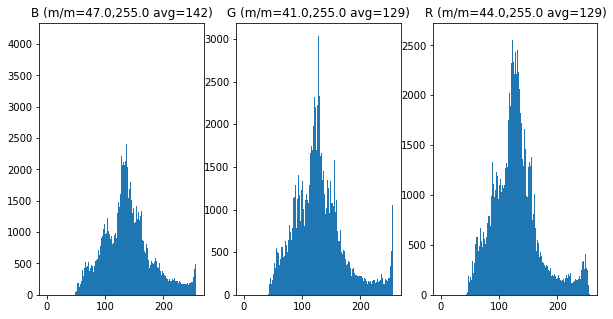

2: xmin=600, xmax=900, ymin=0, ymax=300  -> (resized: 500x300)


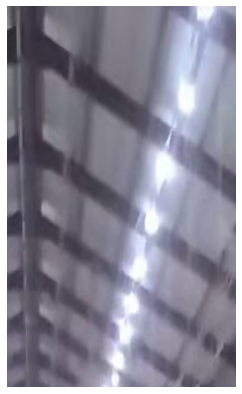

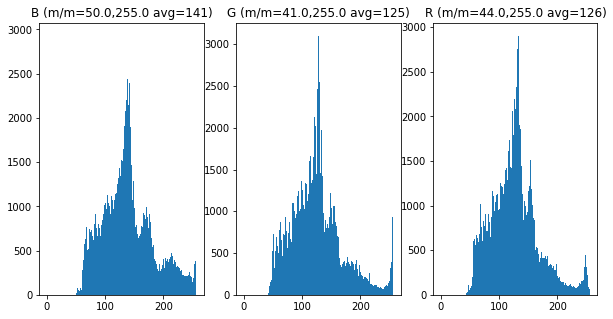

3: xmin=900, xmax=1200, ymin=0, ymax=300  -> (resized: 500x300)


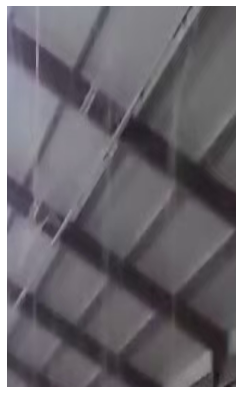

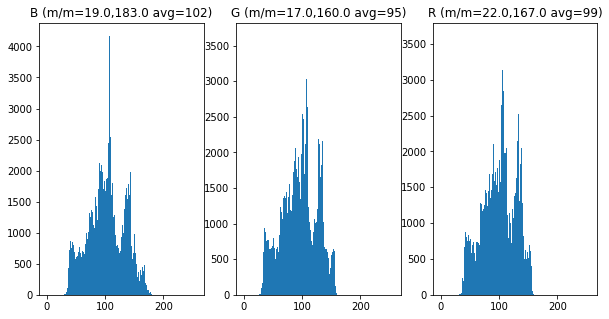

4: xmin=1200, xmax=1500, ymin=0, ymax=300  -> (resized: 500x300)


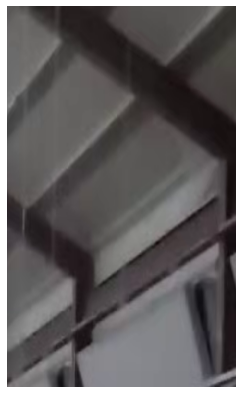

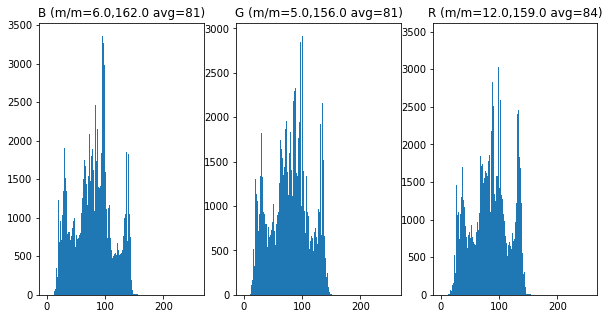

5: xmin=1500, xmax=1800, ymin=0, ymax=300  -> (resized: 500x300)


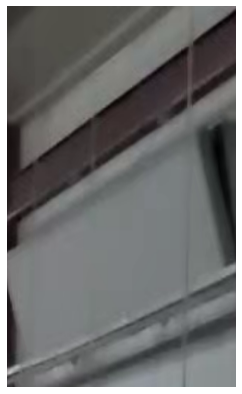

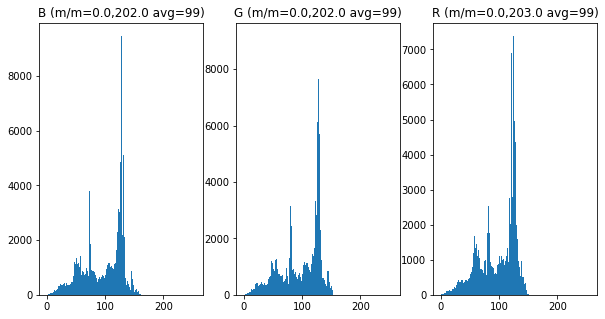

6: xmin=0, xmax=300, ymin=850, ymax=1070  -> (resized: 500x300)


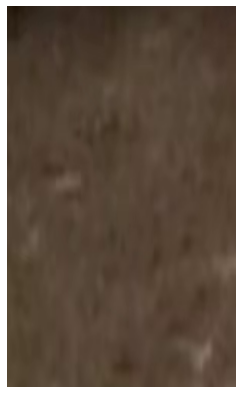

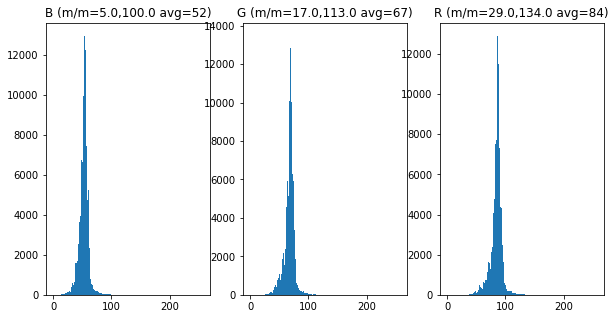

7: xmin=300, xmax=600, ymin=850, ymax=1070  -> (resized: 500x300)


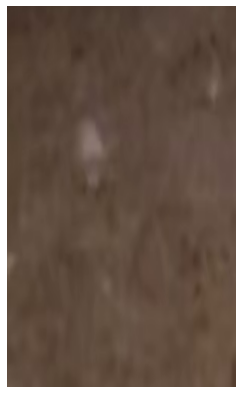

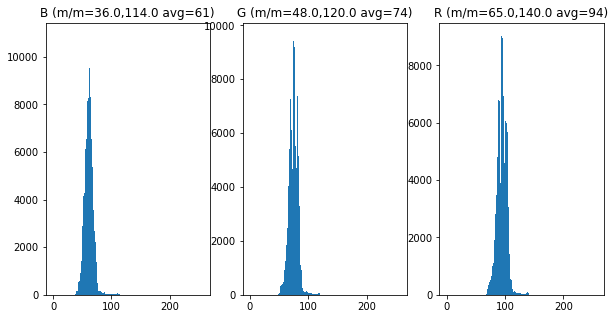

8: xmin=600, xmax=900, ymin=850, ymax=1070  -> (resized: 500x300)


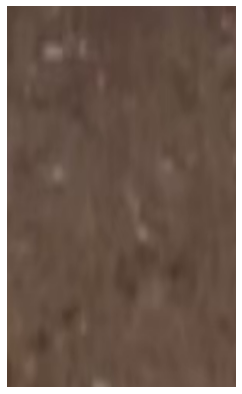

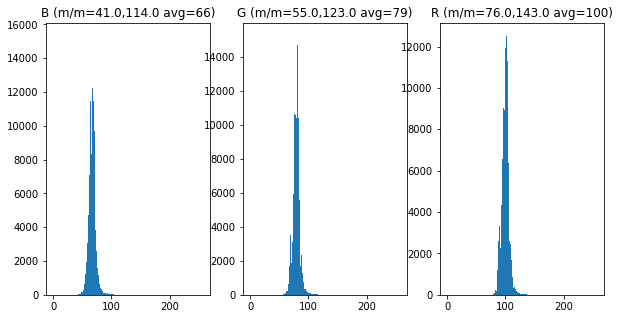

9: xmin=900, xmax=1200, ymin=850, ymax=1070  -> (resized: 500x300)


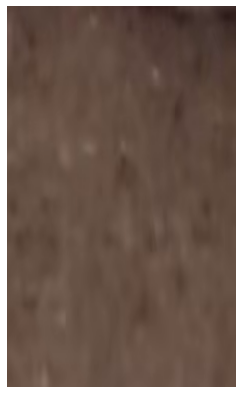

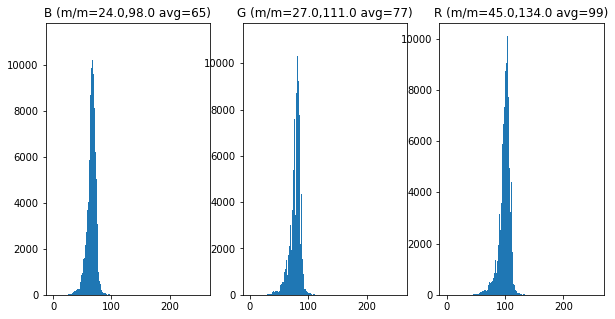

10: xmin=1200, xmax=1500, ymin=850, ymax=1070  -> (resized: 500x300)


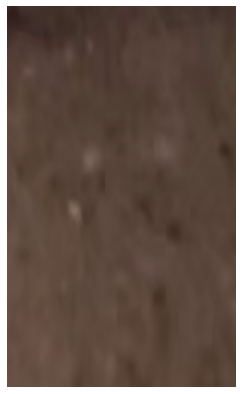

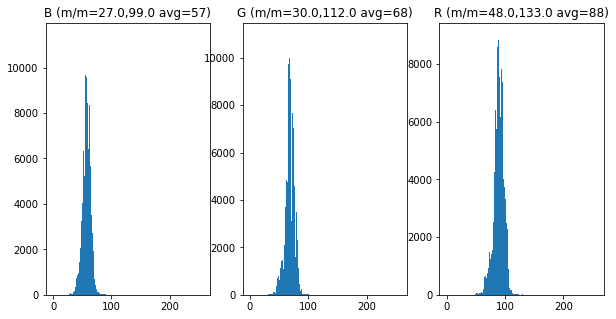

11: xmin=1500, xmax=1800, ymin=850, ymax=1070  -> (resized: 500x300)


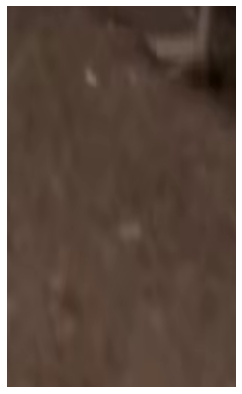

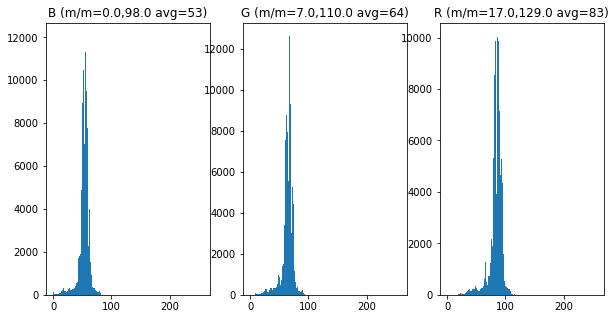

In [40]:
for i,bimg in enumerate(bimgs):
    print(str(i)+":",bimgs_info[i],' -> (resized: 500x300)')
    # show background (resized)
    showImg=bimg
    showImg=cv2.resize(showImg,(300,500))
    imshow(showImg)

    # show histogram of background
    clr=['B','G','R']
    f3, a3 = plt.subplots(1,3,figsize=(10,5))
    a3=a3.ravel()
    for i,ax in enumerate(a3):
        simg=bimg.T[i]
        simg=cv2.resize(simg,(300,500))
        ax.hist(simg.flatten(),range=[0,256],bins=256)
        min_val,max_val,min_loc,max_loc=cv2.minMaxLoc(simg)
        avg_val=round(simg.mean())
        ax.set_title(str(clr[i])+' (m/m={},{} avg={})'.format(min_val,max_val,avg_val))
    plt.show()

##### Make Average Duck Images

0: 40_2_0.png
1: 40_0_2147.png
2: 40_0_2082.png
3: 40_2_77.png
4: 40_0_0.png
5: 40_2_388.png
6: 40_2_155.png
7: 40_2_466.png
8: 40_2_310.png
9: 40_2_233.png


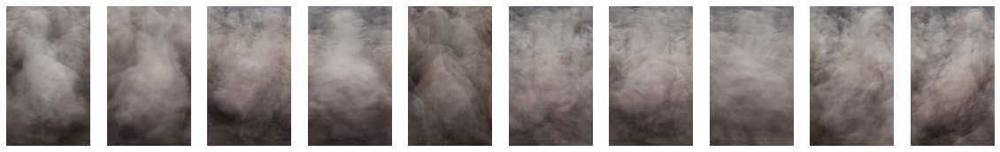

In [41]:
# make average images
avgs=[]
avgs_info=[]

for i,item in enumerate(d):
    acc_bgr=np.zeros(shape=(500,300,3),dtype=np.float32)
    t=0
    current_img=cv2.imread(dir(item))
    for list in d[item]:
        t+=1
        xmin=int(list[0])
        ymin=int(list[1])
        xmax=int(list[2])
        ymax=int(list[3])
        simg=current_img[ymin:ymax,xmin:xmax]
        simg=cv2.resize(simg,(300,500))

        acc_bgr=simg+acc_bgr # 누적 영상 구하기
        avg_bgr=acc_bgr/t # t로 나누어서 평균영상 구하기
        dst_bgr=cv2.convertScaleAbs(avg_bgr)
    avgs.append(dst_bgr)
    avgs_info.append(item)
    print(str(i)+': '+ avgs_info[i])

    # 10개의 이미지에 대해 진행
    if i+1 == 10:
        break

# show average images
f, a = plt.subplots(1,10,figsize=(20,20))
a=a.ravel()
for i,ax in enumerate(a):
    avg_img=cv2.cvtColor(avgs[i],cv2.COLOR_BGR2RGB)
    ax.imshow(avg_img)
    ax.axis('off')
plt.show()

##### Check Historgram (Average Duck)

0: 40_2_0.png


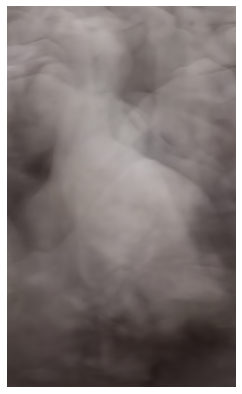

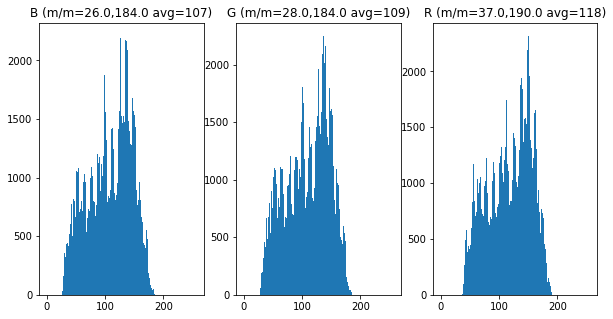

1: 40_0_2147.png


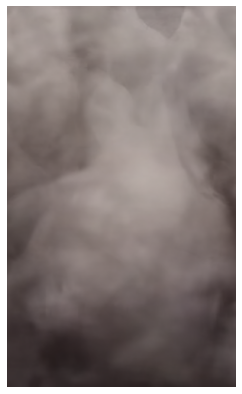

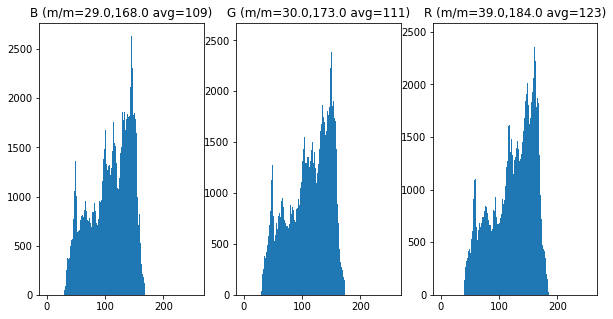

2: 40_0_2082.png


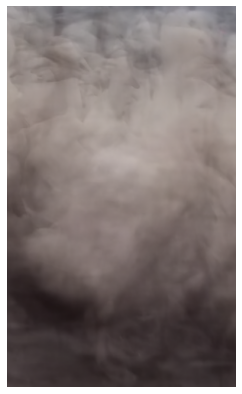

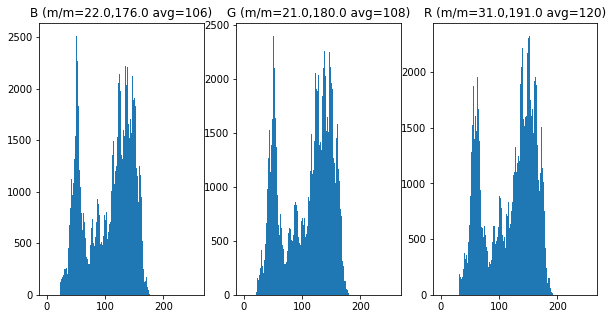

3: 40_2_77.png


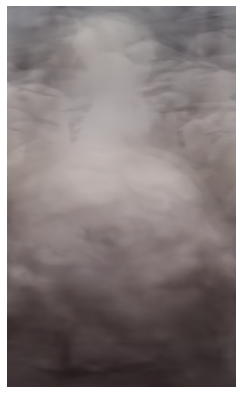

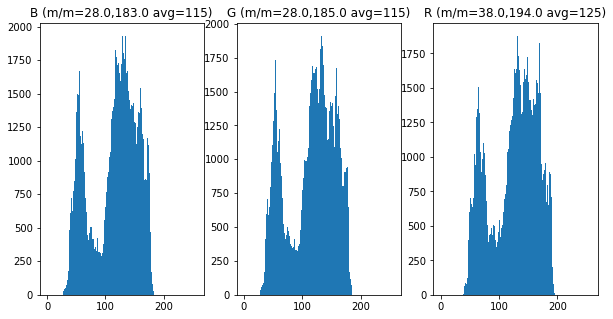

4: 40_0_0.png


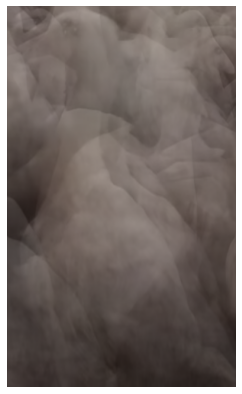

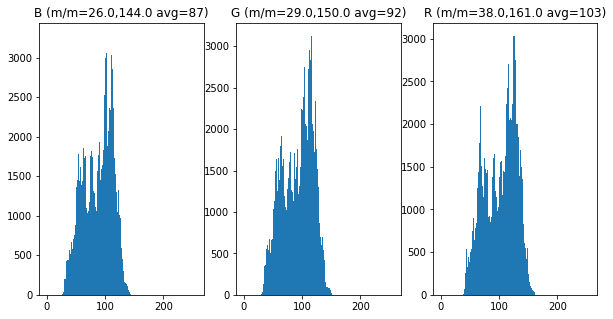

5: 40_2_388.png


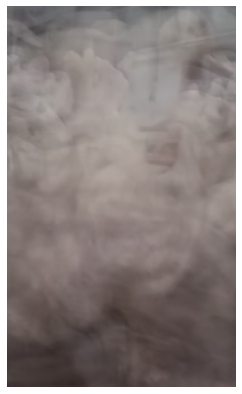

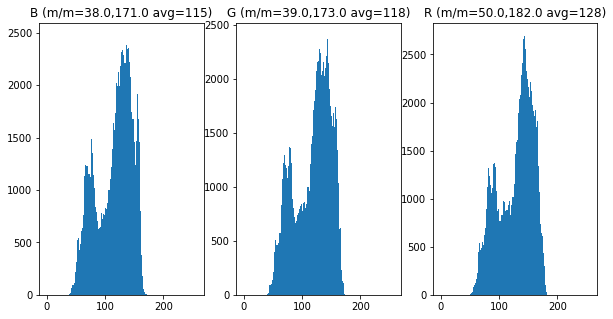

6: 40_2_155.png


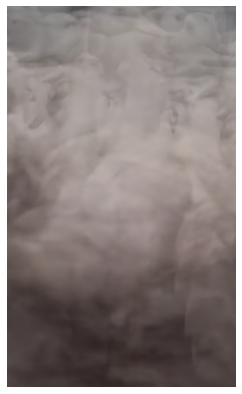

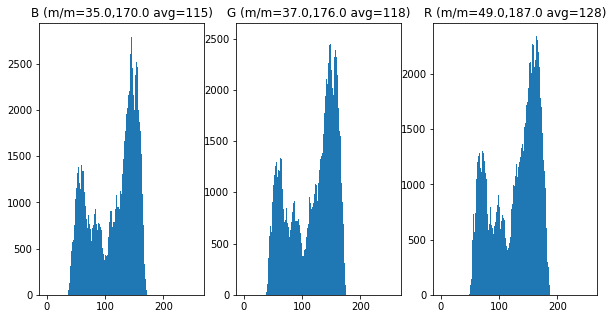

7: 40_2_466.png


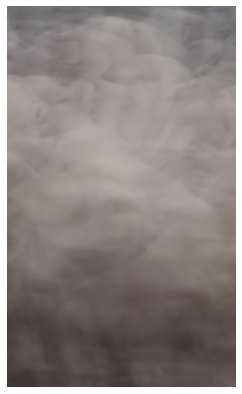

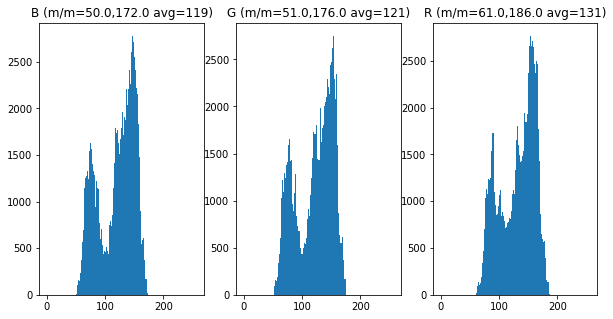

8: 40_2_310.png


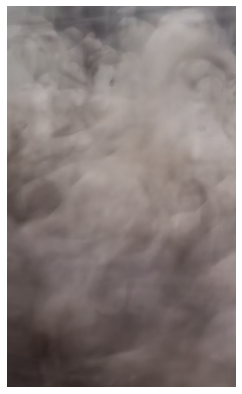

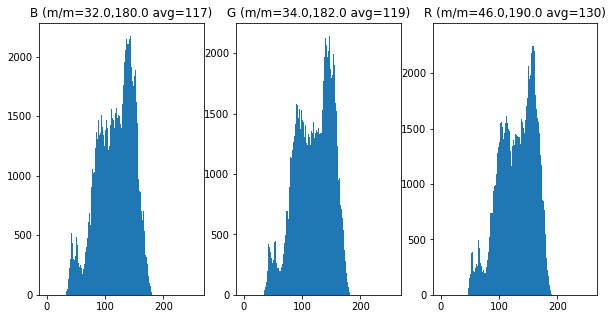

9: 40_2_233.png


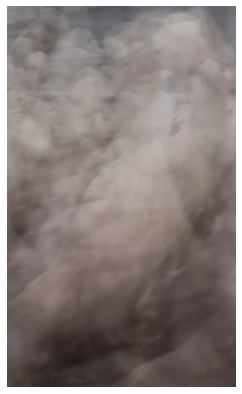

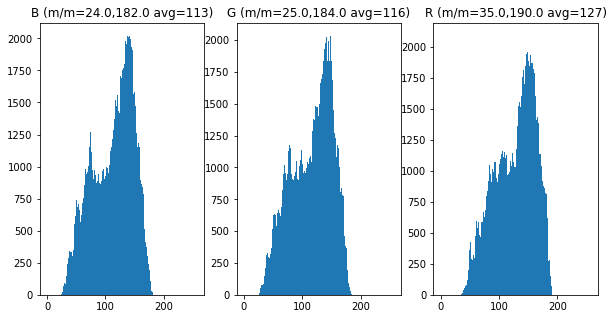

In [42]:
for i,avg in enumerate(avgs):
    print(str(i)+":",avgs_info[i])
    # show average image (resized)
    showImg=avg
    imshow(showImg)

    # show histogram of background
    clr=['B','G','R']
    f, a = plt.subplots(1,3,figsize=(10,5))
    a=a.ravel()
    for i,ax in enumerate(a):
        simg=avg.T[i]
        ax.hist(simg.flatten(),range=[0,256],bins=256)
        min_val,max_val,min_loc,max_loc=cv2.minMaxLoc(simg)
        avg_val=round(simg.mean())
        ax.set_title(str(clr[i])+' (m/m={},{} avg={})'.format(min_val,max_val,avg_val))
    plt.show()

##### Image Processing Functions

In [43]:
# bgr image -> equalized bgr image
def equalizing_image(img):
    # convert to YCrCb
    ycrcv_img=cv2.cvtColor(img,cv2.COLOR_BGR2YCR_CB)
    # equalize
    ycrcv_img[:,:,0]=cv2.equalizeHist(ycrcv_img[:,:,0])
    # convert back
    stretched=cv2.cvtColor(ycrcv_img,cv2.COLOR_YCR_CB2BGR)
    return stretched

In [44]:
# bgr image -> sharpened bgr image
def sharpening_image(img):
    sharpening_ = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    img=cv2.filter2D(img, -1, sharpening_)
    return img 

In [45]:
# bgr image -> bgr image with corner points
def fast_corner_image(img):
    fast=cv2.FastFeatureDetector_create(30) # detector객체 생성 
    fast.setNonmaxSuppression(0) # 논맥시멈 서프레션을 하지를 않음 (가끔 찾은 코너를 지워버리는 경우가 생김) 
    kp=fast.detect(img) # 키 포인트를 찾아냄
    cv2.drawKeypoints(img,kp,img,(0,0,255)) # 키 포인트를 그려주는 함수
    return img

##### Find Corner (Duck)

0: xmin=192, xmax=409, ymin=415, ymax=838


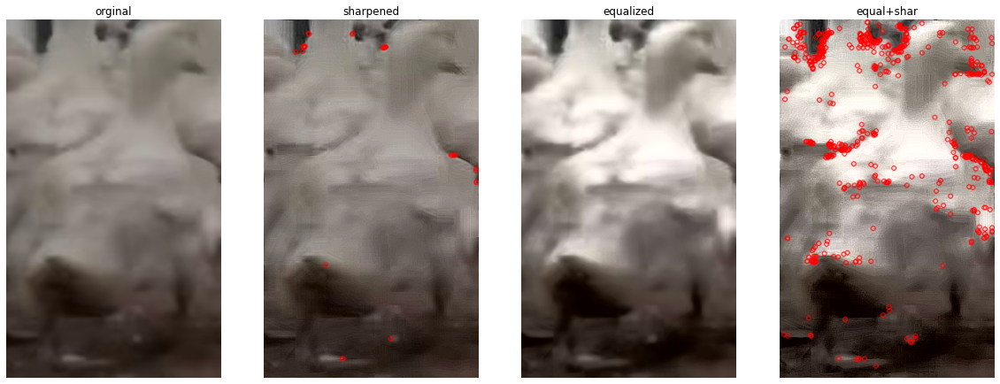

1: xmin=445, xmax=641, ymin=407, ymax=811


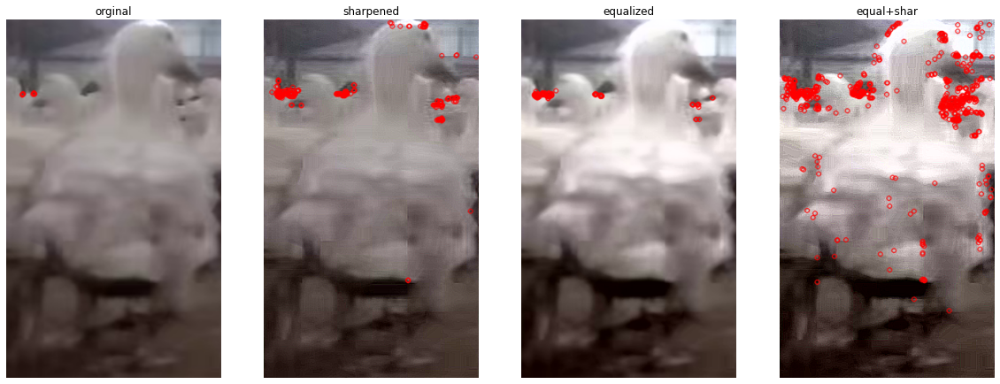

2: xmin=720, xmax=921, ymin=403, ymax=832


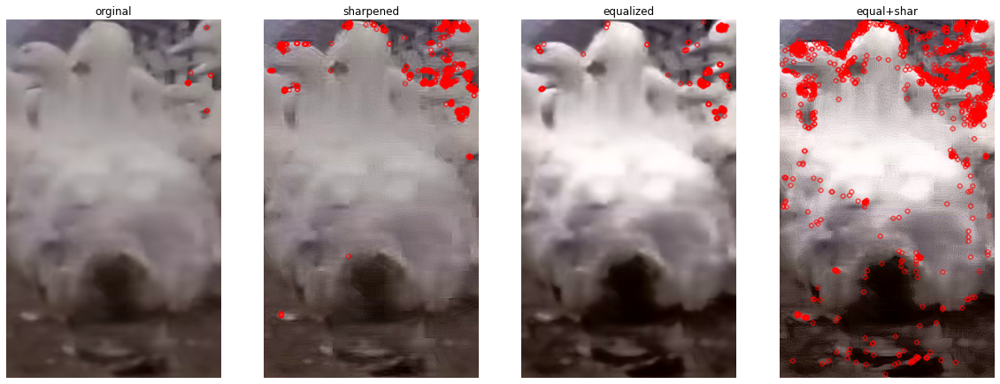

3: xmin=1038, xmax=1224, ymin=377, ymax=864


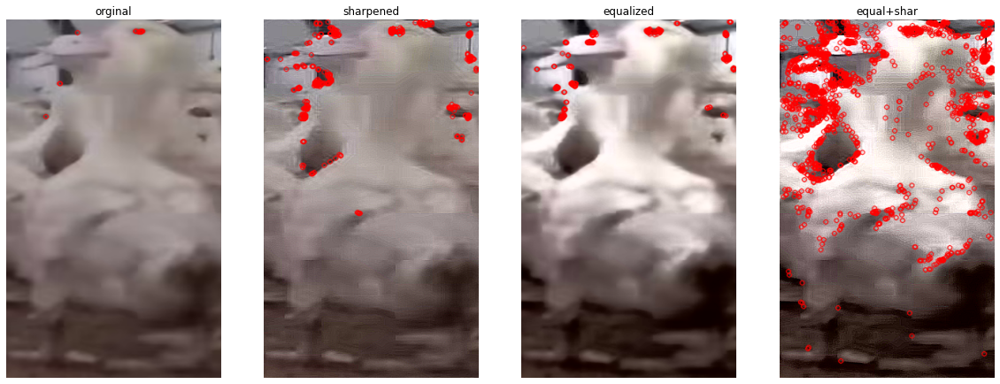

4: xmin=1277, xmax=1514, ymin=424, ymax=767


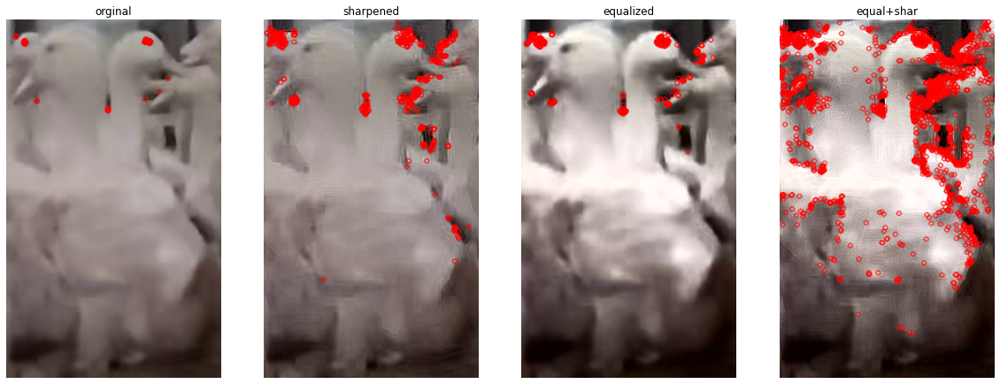

5: xmin=1521, xmax=1743, ymin=418, ymax=806


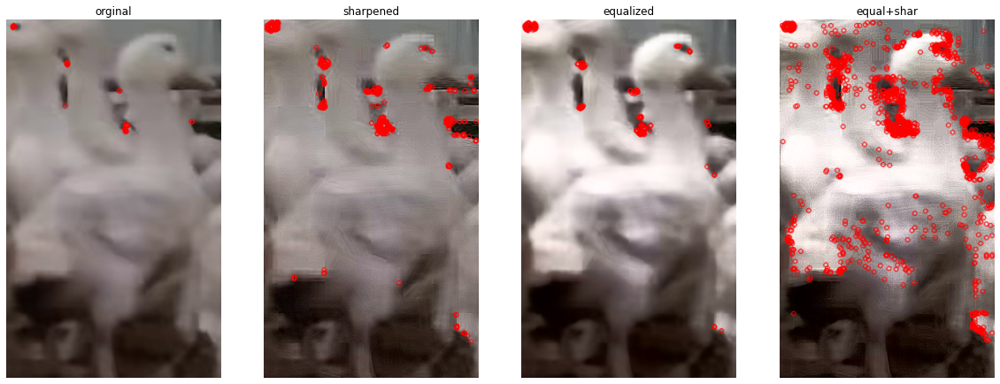

6: xmin=1696, xmax=1915, ymin=419, ymax=906


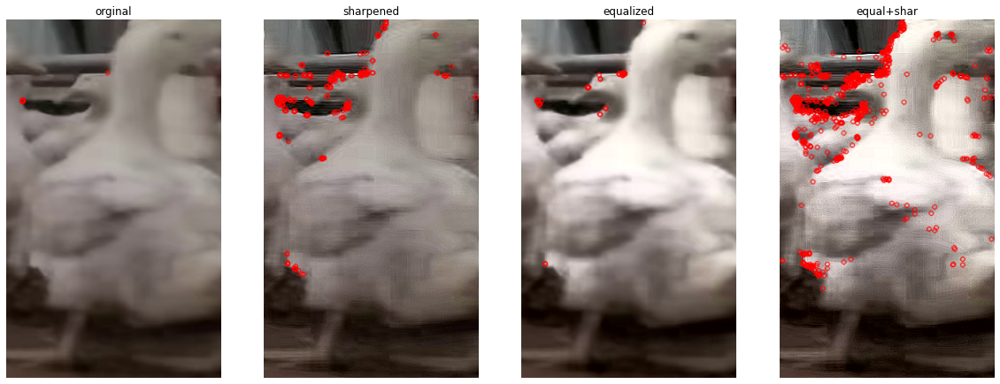

In [46]:
info=['orginal','sharpened','equalized','equal+shar']

for i,duck in enumerate(ducks):
    print(str(i)+":",ducks_info[i])
    original=duck

    # find corner
    f, a = plt.subplots(1,4,figsize=(20,10))
    a=a.ravel()
    for i,ax in enumerate(a):
        # original duck
        if i==0:
            showImg=fast_corner_image(original)

        # sharpened duck
        if i==1:
            sharpened=sharpening_image(original)
            showImg=fast_corner_image(sharpened)

        # equalized duck
        if i>=2:
            equalized=equalizing_image(original)
            if i==2:
                showImg=fast_corner_image(equalized)

        # equalized+sharpening duck
        if i==3:
            fusion=sharpening_image(equalized)
            showImg=fast_corner_image(fusion)
    
        ax.set_title(info[i])
        ax.axis('off')
        ax.imshow(cv2.cvtColor(showImg,cv2.COLOR_BGR2RGB))
    plt.show()

##### Find Corner (Average Duck)

0: 40_2_0.png


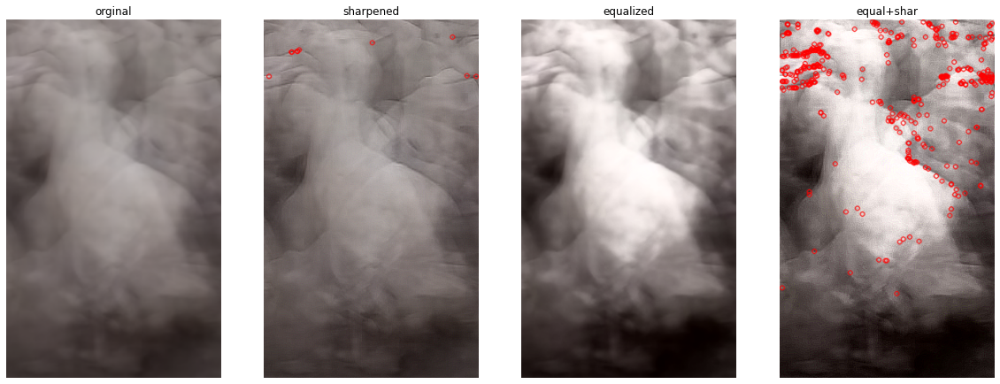

1: 40_0_2147.png


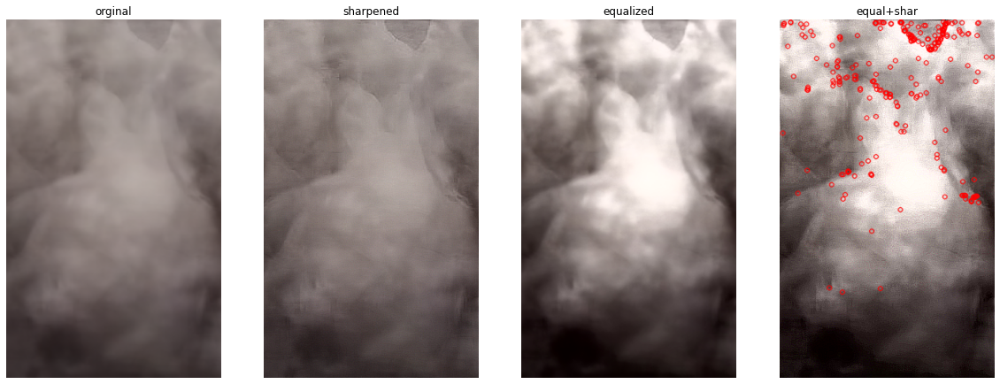

2: 40_0_2082.png


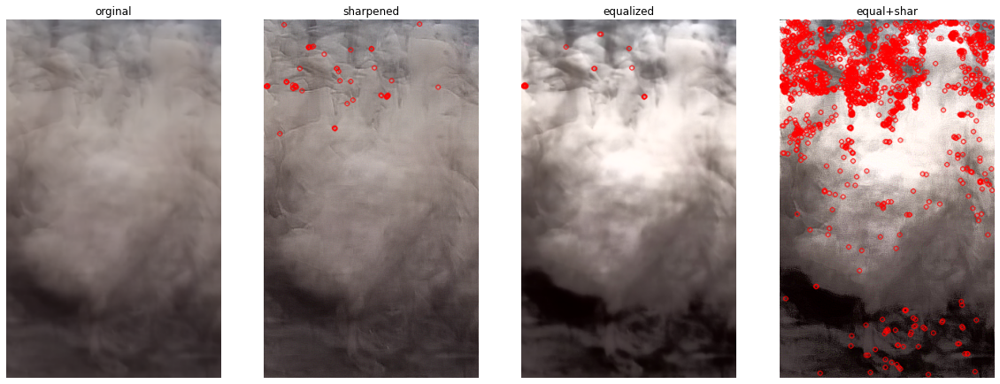

3: 40_2_77.png


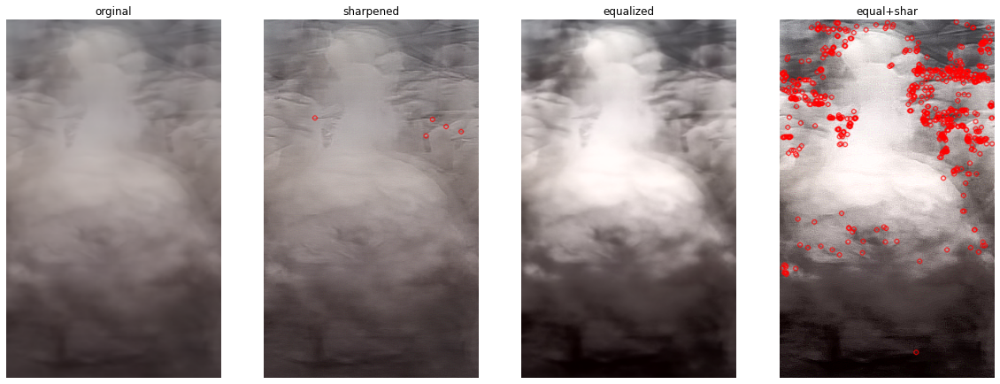

4: 40_0_0.png


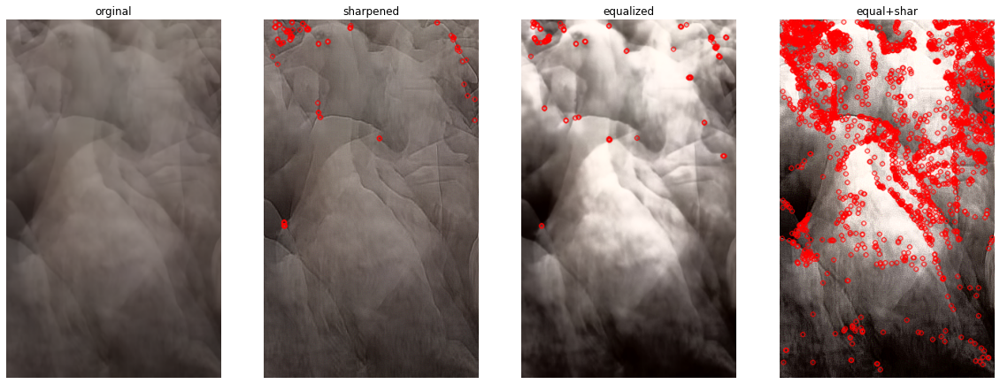

5: 40_2_388.png


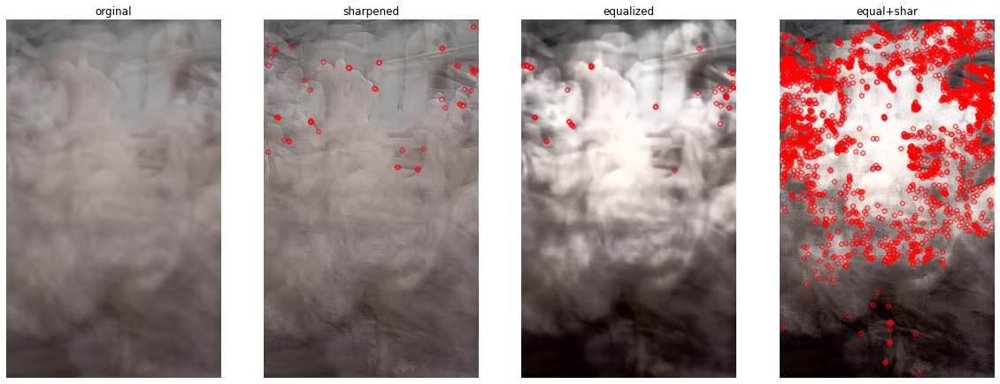

6: 40_2_155.png


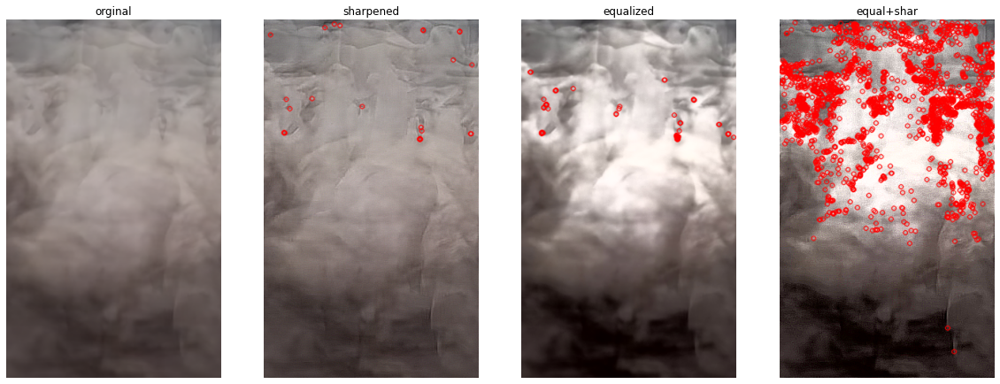

7: 40_2_466.png


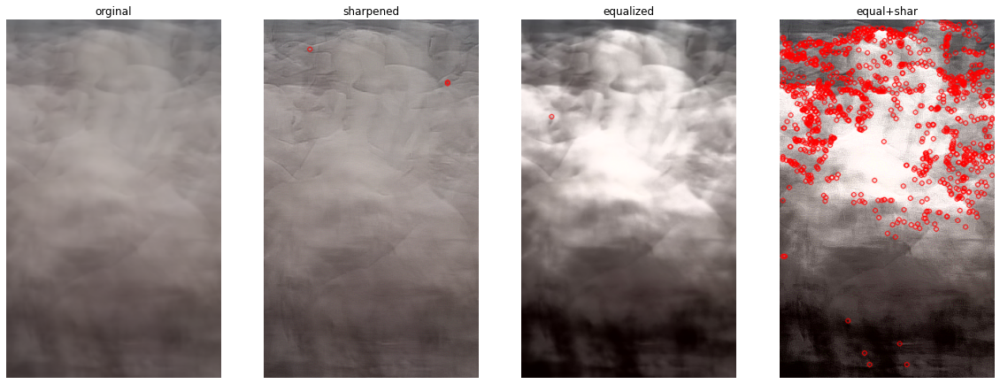

8: 40_2_310.png


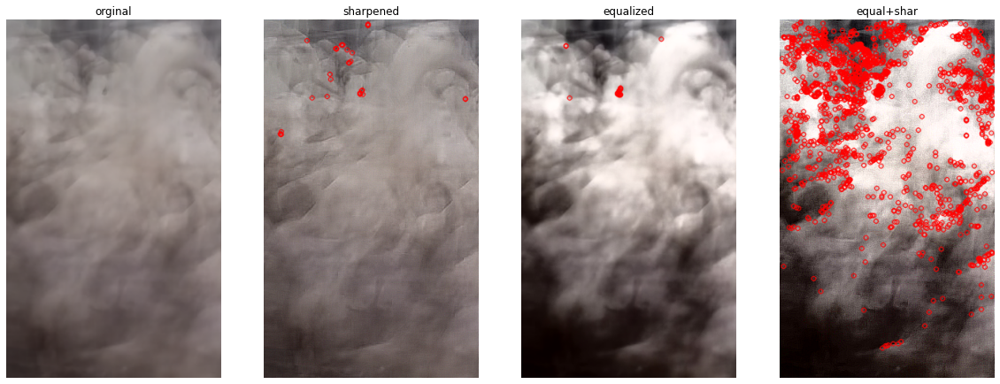

9: 40_2_233.png


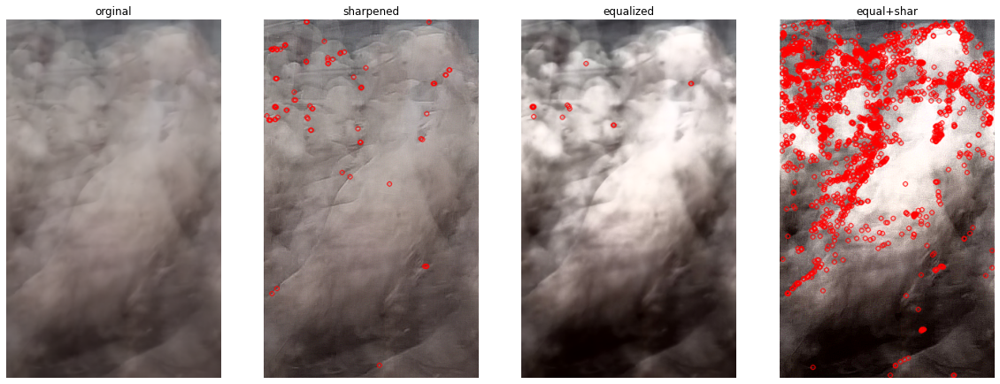

In [47]:
info=['orginal','sharpened','equalized','equal+shar']

for i,avg in enumerate(avgs):
    print(str(i)+":",avgs_info[i])
    # find corner
    f, a = plt.subplots(1,4,figsize=(20,10))
    a=a.ravel()
    for i,ax in enumerate(a):
        # original duck
        if i==0:
            showImg=fast_corner_image(avg)

        # sharpened duck
        if i==1:
            sharpened=sharpening_image(avg)
            showImg=fast_corner_image(sharpened)

        # equalized duck
        if i>=2:
            equalized=equalizing_image(avg)
            if i==2:
                showImg=fast_corner_image(equalized)

        # equalized+sharpening duck
        if i==3:
            fusion=sharpening_image(equalized)
            showImg=fast_corner_image(fusion)
    
        ax.set_title(info[i])
        ax.axis('off')
        ax.imshow(cv2.cvtColor(showImg,cv2.COLOR_BGR2RGB))
    plt.show()

##### RGB Average of All Ducks

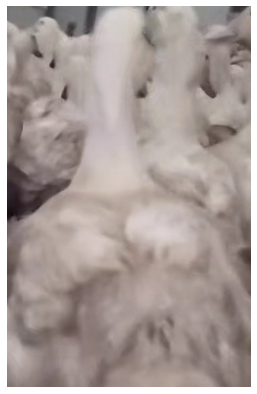

1000 ducks
blue_avergage(max):204.486, blue_average(min):6.556, blue_average(avg):113.484
green_avergage(max):202.816, green_average(min):8.217, green_average(avg):115.56
red_avergage(max):208.999, red_average(min):18.291, red_average(avg):126.075


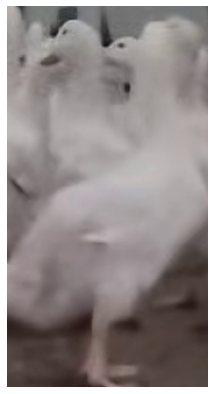

2000 ducks
blue_avergage(max):210.5035, blue_average(min):7.591, blue_average(avg):116.8355
green_avergage(max):209.529, green_average(min):10.0335, green_average(avg):119.3285
red_avergage(max):214.5265, red_average(min):22.159, red_average(avg):130.202


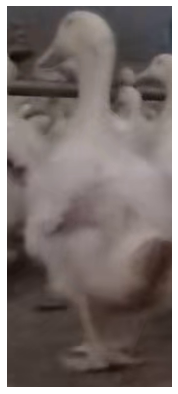

3000 ducks
blue_avergage(max):203.58333333333334, blue_average(min):8.390333333333333, blue_average(avg):115.32833333333333
green_avergage(max):202.48066666666668, green_average(min):10.784333333333333, green_average(avg):117.53866666666667
red_avergage(max):208.08366666666666, red_average(min):22.057666666666666, red_average(avg):128.25733333333332


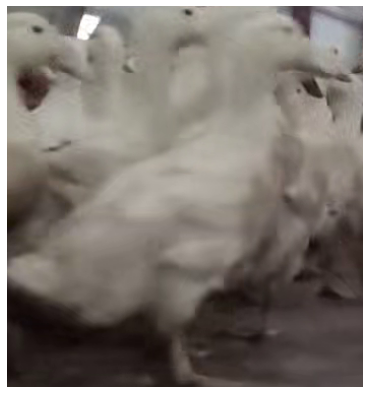

4000 ducks
blue_avergage(max):208.384, blue_average(min):9.1735, blue_average(avg):117.08025
green_avergage(max):207.30525, green_average(min):11.8715, green_average(avg):119.3435
red_avergage(max):212.4665, red_average(min):23.69925, red_average(avg):130.24175

4509 ducks
blue_avergage(max):210.5136393878909, blue_average(min):9.11909514304724, blue_average(avg):116.93413173652695
green_avergage(max):209.57728986471503, green_average(min):11.673098247948547, green_average(avg):119.33621645597694
red_avergage(max):214.4839210467953, red_average(min):23.300731869594145, red_average(avg):129.99911288534042


In [48]:
acc_max=[0 for i in range(3)] # (b,g,r)=(0,0,0)
acc_min=[0 for i in range(3)]
acc_avg=[0 for i in range(3)]
avg_max=[0 for i in range(3)]
avg_min=[0 for i in range(3)]
avg_avg=[0 for i in range(3)]
duck_num=0

clr=['blue','green','red']

for i,item in enumerate(d):
    current_img=cv2.imread(dir(item))
    for list in d[item]:
        xmin=int(list[0])
        ymin=int(list[1])
        xmax=int(list[2])
        ymax=int(list[3])
        duck=current_img[ymin:ymax,xmin:xmax]
        duck_num+=1

        for i in range(3):
            pxs=duck.T[i]
            min_val,max_val,min_loc,max_loc=cv2.minMaxLoc(pxs)
            avg_val=round(pxs.mean())

            # pxs_average_max
            acc_max[i]=acc_max[i]+max_val
            avg_max[i]=acc_max[i]/duck_num

            # pxs_average_min
            acc_min[i]=acc_min[i]+min_val
            avg_min[i]=acc_min[i]/duck_num

            # pxs_average_avg
            acc_avg[i]=acc_avg[i]+avg_val
            avg_avg[i]=acc_avg[i]/duck_num
            
        if duck_num % 1000 == 0:
            imshow(duck)
            print(duck_num,'ducks')
            for i in range(3):
                print('{}_avergage(max):{}, {}_average(min):{}, {}_average(avg):{}'.format(clr[i],avg_max[i],clr[i],avg_min[i],clr[i],avg_avg[i]))

print('\n',duck_num,' ducks',sep='')
for i in range(3):
    print('{}_avergage(max):{}, {}_average(min):{}, {}_average(avg):{}'.format(clr[i],avg_max[i],clr[i],avg_min[i],clr[i],avg_avg[i]))

4509 ducks


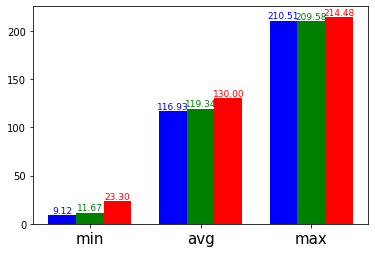

In [49]:
print(duck_num,'ducks')

x_info=['min','avg','max']

# blue data setting
x1=[1,3,5]
blue=[avg_min[0],avg_avg[0],avg_max[0]]
plt.bar(x1,blue,color='b',width=0.5)
for i,x in enumerate(x1):
    plt.text(x,blue[i],'{:.2f}'.format(blue[i]),fontsize=9,color='blue',horizontalalignment='center',verticalalignment='bottom')

# green data setting
x2=[1.5,3.5,5.5]
green=[avg_min[1],avg_avg[1],avg_max[1]]
plt.bar(x2,green,color='g',width=0.5)
for i,x in enumerate(x2):
    plt.text(x,green[i],'{:.2f}'.format(green[i]),fontsize=9,color='green',horizontalalignment='center',verticalalignment='bottom')

# red data setting
x3=[2,4,6]
red=[avg_min[2],avg_avg[2],avg_max[2]]
plt.bar(x3,red,color='r',width=0.5)
for i,x in enumerate(x3):
    plt.text(x,red[i],'{:.2f}'.format(red[i]),fontsize=9,color='red',horizontalalignment='center',verticalalignment='bottom')

# show
plt.xticks(x2,x_info,fontsize=15,rotation=0) # x축 text 표시는 가운데 기준
plt.show()

##### Ceil RGB Average

2


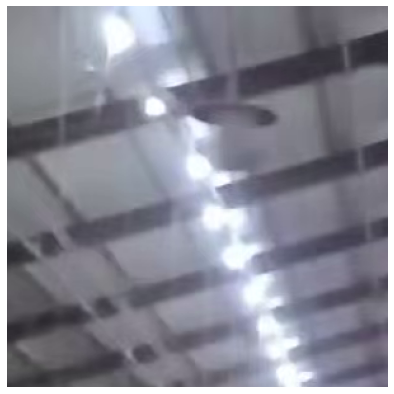

blue_avergage(max):201.0, blue_average(min):31.0, blue_average(avg):110.0
green_avergage(max):199.0, green_average(min):28.0, green_average(avg):104.0
red_avergage(max):197.5, red_average(min):29.0, red_average(avg):104.5
4


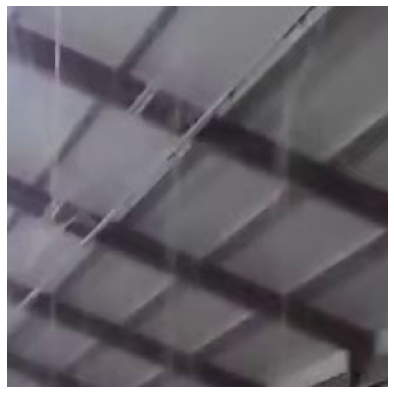

blue_avergage(max):210.0, blue_average(min):32.75, blue_average(avg):115.75
green_avergage(max):203.25, green_average(min):28.5, green_average(avg):107.0
red_avergage(max):204.5, red_average(min):31.0, red_average(avg):108.75
6


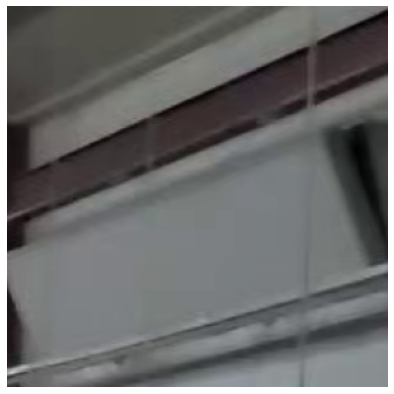

blue_avergage(max):200.83333333333334, blue_average(min):22.666666666666668, blue_average(avg):107.16666666666667
green_avergage(max):195.33333333333334, green_average(min):19.666666666666668, green_average(avg):101.33333333333333
red_avergage(max):196.83333333333334, red_average(min):22.666666666666668, red_average(avg):103.0

6 ceil_images
blue_avergage(max):200.83333333333334, blue_average(min):22.666666666666668, blue_average(avg):107.16666666666667
green_avergage(max):195.33333333333334, green_average(min):19.666666666666668, green_average(avg):101.33333333333333
red_avergage(max):196.83333333333334, red_average(min):22.666666666666668, red_average(avg):103.0


In [28]:
acc_max=[0 for i in range(3)] # (b,g,r)=(0,0,0)
acc_min=[0 for i in range(3)]
acc_avg=[0 for i in range(3)]
avg_max=[0 for i in range(3)]
avg_min=[0 for i in range(3)]
avg_avg=[0 for i in range(3)]
ceil_num=0

clr=['blue','green','red']

for i,item in enumerate(bimgs):
    if i<6:
        ceil_num+=1
        for i in range(3):
            pxs=item.T[i]
            min_val,max_val,min_loc,max_loc=cv2.minMaxLoc(pxs)
            avg_val=round(pxs.mean())

            # pxs_average_max
            acc_max[i]=acc_max[i]+max_val
            avg_max[i]=acc_max[i]/ceil_num

            # pxs_average_min
            acc_min[i]=acc_min[i]+min_val
            avg_min[i]=acc_min[i]/ceil_num

            # pxs_average_avg
            acc_avg[i]=acc_avg[i]+avg_val
            avg_avg[i]=acc_avg[i]/ceil_num

        if ceil_num %2 ==0:
            print(ceil_num)
            imshow(item)
            for i in range(3):
                print('{}_avergage(max):{}, {}_average(min):{}, {}_average(avg):{}'.format(clr[i],avg_max[i],clr[i],avg_min[i],clr[i],avg_avg[i]))

print('\n',ceil_num,' ceil_images',sep='')
for i in range(3):
    print('{}_avergage(max):{}, {}_average(min):{}, {}_average(avg):{}'.format(clr[i],avg_max[i],clr[i],avg_min[i],clr[i],avg_avg[i]))

6 ceil_images


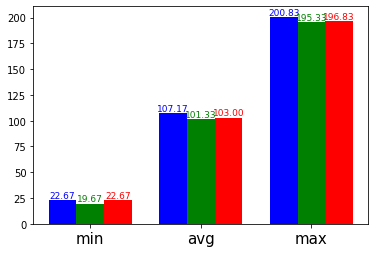

In [21]:
print(ceil_num,'ceil_images')

x_info=['min','avg','max']

# blue data setting
x1=[1,3,5]
blue=[avg_min[0],avg_avg[0],avg_max[0]]
plt.bar(x1,blue,color='b',width=0.5)
for i,x in enumerate(x1):
    plt.text(x,blue[i],'{:.2f}'.format(blue[i]),fontsize=9,color='blue',horizontalalignment='center',verticalalignment='bottom')

# green data setting
x2=[1.5,3.5,5.5]
green=[avg_min[1],avg_avg[1],avg_max[1]]
plt.bar(x2,green,color='g',width=0.5)
for i,x in enumerate(x2):
    plt.text(x,green[i],'{:.2f}'.format(green[i]),fontsize=9,color='green',horizontalalignment='center',verticalalignment='bottom')

# red data setting
x3=[2,4,6]
red=[avg_min[2],avg_avg[2],avg_max[2]]
plt.bar(x3,red,color='r',width=0.5)
for i,x in enumerate(x3):
    plt.text(x,red[i],'{:.2f}'.format(red[i]),fontsize=9,color='red',horizontalalignment='center',verticalalignment='bottom')

# show
plt.xticks(x2,x_info,fontsize=15,rotation=0) # x축 text 표시는 가운데 기준
plt.show()

##### Floor RGB Average

2


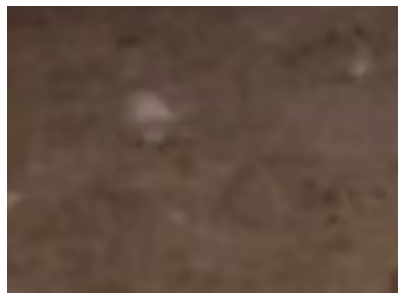

blue_avergage(max):107.0, blue_average(min):20.5, blue_average(avg):56.5
green_avergage(max):116.5, green_average(min):32.5, green_average(avg):70.5
red_avergage(max):137.0, red_average(min):47.0, red_average(avg):89.0
4


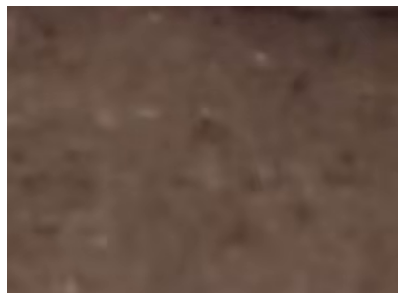

blue_avergage(max):106.75, blue_average(min):26.5, blue_average(avg):61.0
green_avergage(max):117.0, green_average(min):36.75, green_average(avg):74.25
red_avergage(max):138.0, red_average(min):53.75, red_average(avg):94.25
6


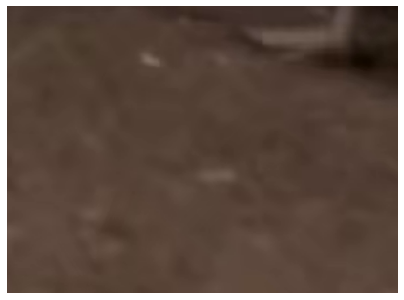

blue_avergage(max):104.16666666666667, blue_average(min):22.166666666666668, blue_average(avg):59.0
green_avergage(max):115.16666666666667, green_average(min):30.666666666666668, green_average(avg):71.5
red_avergage(max):135.83333333333334, red_average(min):46.666666666666664, red_average(avg):91.5

6 floor_images
blue_avergage(max):104.16666666666667, blue_average(min):22.166666666666668, blue_average(avg):59.0
green_avergage(max):115.16666666666667, green_average(min):30.666666666666668, green_average(avg):71.5
red_avergage(max):135.83333333333334, red_average(min):46.666666666666664, red_average(avg):91.5


In [29]:
acc_max=[0 for i in range(3)] # (b,g,r)=(0,0,0)
acc_min=[0 for i in range(3)]
acc_avg=[0 for i in range(3)]
avg_max=[0 for i in range(3)]
avg_min=[0 for i in range(3)]
avg_avg=[0 for i in range(3)]
floor_num=0

clr=['blue','green','red']

for i,item in enumerate(bimgs):
    if i>=6:
        floor_num+=1
        for i in range(3):
            pxs=item.T[i]
            min_val,max_val,min_loc,max_loc=cv2.minMaxLoc(pxs)
            avg_val=round(pxs.mean())

            # pxs_average_max
            acc_max[i]=acc_max[i]+max_val
            avg_max[i]=acc_max[i]/floor_num

            # pxs_average_min
            acc_min[i]=acc_min[i]+min_val
            avg_min[i]=acc_min[i]/floor_num

            # pxs_average_avg
            acc_avg[i]=acc_avg[i]+avg_val
            avg_avg[i]=acc_avg[i]/floor_num

        if (floor_num-6) %2 ==0:
            print(floor_num)
            imshow(item)
            for i in range(3):
                print('{}_avergage(max):{}, {}_average(min):{}, {}_average(avg):{}'.format(clr[i],avg_max[i],clr[i],avg_min[i],clr[i],avg_avg[i]))

print('\n',floor_num,' floor_images',sep='')
for i in range(3):
    print('{}_avergage(max):{}, {}_average(min):{}, {}_average(avg):{}'.format(clr[i],avg_max[i],clr[i],avg_min[i],clr[i],avg_avg[i]))

6 floor_images


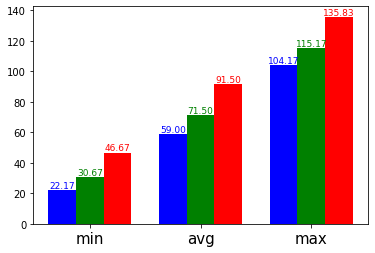

In [30]:
print(floor_num,'floor_images')

x_info=['min','avg','max']

# blue data setting
x1=[1,3,5]
blue=[avg_min[0],avg_avg[0],avg_max[0]]
plt.bar(x1,blue,color='b',width=0.5)
for i,x in enumerate(x1):
    plt.text(x,blue[i],'{:.2f}'.format(blue[i]),fontsize=9,color='blue',horizontalalignment='center',verticalalignment='bottom')

# green data setting
x2=[1.5,3.5,5.5]
green=[avg_min[1],avg_avg[1],avg_max[1]]
plt.bar(x2,green,color='g',width=0.5)
for i,x in enumerate(x2):
    plt.text(x,green[i],'{:.2f}'.format(green[i]),fontsize=9,color='green',horizontalalignment='center',verticalalignment='bottom')

# red data setting
x3=[2,4,6]
red=[avg_min[2],avg_avg[2],avg_max[2]]
plt.bar(x3,red,color='r',width=0.5)
for i,x in enumerate(x3):
    plt.text(x,red[i],'{:.2f}'.format(red[i]),fontsize=9,color='red',horizontalalignment='center',verticalalignment='bottom')

# show
plt.xticks(x2,x_info,fontsize=15,rotation=0) # x축 text 표시는 가운데 기준
plt.show()

##### Find Corner of Slapped Duck

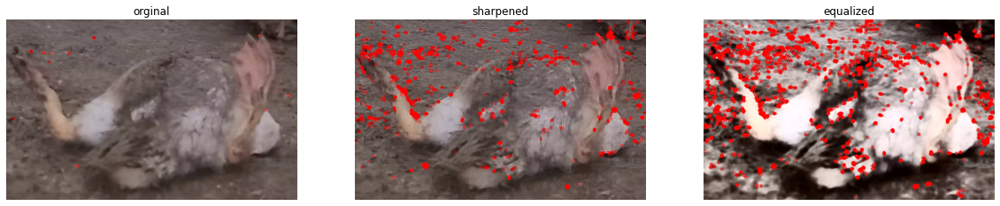

In [20]:
s_img=cv2.imread(dir('36_1_1659.png'))
for list in d['36_1_1659.png']:
    if list[4]=='slapped':
        xmin=int(list[0])
        ymin=int(list[1])
        xmax=int(list[2])
        ymax=int(list[3])
        duck=s_img[ymin:ymax,xmin:xmax]

info=['orginal','sharpened','equalized']

# find corner
original=duck
f, a = plt.subplots(1,3,figsize=(20,20))
a=a.ravel()
for i,ax in enumerate(a):
    # original duck
    if i==0:
        showImg=fast_corner_image(original)

    # sharpened duck
    if i==1:
        sharpened=sharpening_image(original)
        showImg=fast_corner_image(sharpened)

    # equalized duck
    if i==2:
        equalized=equalizing_image(original)
        showImg=fast_corner_image(equalized)

    ax.set_title(info[i])
    ax.axis('off')
    ax.imshow(cv2.cvtColor(showImg,cv2.COLOR_BGR2RGB))
plt.show()

##### Find Corner of Dead Duck

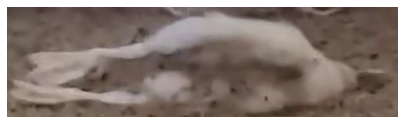

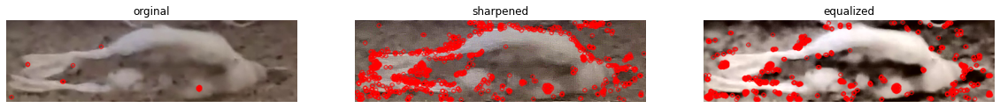

In [21]:
d_img=cv2.imread(dir('24_0_504.png'))
for list in d['24_0_504.png']:
    if list[4]=='dead':
        xmin=int(list[0])
        ymin=int(list[1])
        xmax=int(list[2])
        ymax=int(list[3])
        duck=d_img[ymin:ymax,xmin:xmax]
        imshow(duck)

info=['orginal','sharpened','equalized']

# find corner
original=duck
f, a = plt.subplots(1,3,figsize=(20,20))
a=a.ravel()
for i,ax in enumerate(a):
    # original duck
    if i==0:
        showImg=fast_corner_image(original)

    # sharpened duck
    if i==1:
        sharpened=sharpening_image(original)
        showImg=fast_corner_image(sharpened)

    # equalized duck
    if i==2:
        equalized=equalizing_image(original)
        showImg=fast_corner_image(equalized)

    ax.set_title(info[i])
    ax.axis('off')
    ax.imshow(cv2.cvtColor(showImg,cv2.COLOR_BGR2RGB))
plt.show()